# Άσκηση 3: Βελτιστοποίηση συναρτήσεων με Γενετικούς Αλγόριθμους

### Ομάδα Α29

Όνοματεπώνυμο  | ΑΜ |
-------------- | ---| 
Κοσμάς Στεφανόπουλος | 03113098
Φωτεινή Στρατή | 03113001

Σε αυτή την άσκηση ζητείται να μελετήσουμε και να ελαχιστοποιήσουμε με χρήση Γενετικών Αλγορίθμων και της βιβλιοθήκης DEAP μια μη κλιμακώσιμη και μια κλιμακώσιμη συνάρτηση. Για το σκοπό αυτό θα χρησιμοποιήσουμε ως γονίδια πραγματικούς αριθμούς και ως χρωμοσώματα λίστες γονιδίων μήκους ίσο με τη διάσταση του πεδίου ορισμού της συνάρτησης.

Οι συναρτήσεις που καλούμαστε να ελαχιστοποιήσουμε είναι:

Type | Number | Name | Global Minimum |
---- | ------ | ---- | -------------- |
Non-Scalable | 46 | deVilliers Glasser 1 Function | 0
Scalable | 169 | Xin-She Yang (Function 1) | 0

Για τις παραπάνω συναρτήσεις θα πρέπει να δοκιμαστούν διάφοροι γενετικοί αλγόριθμοι, δηλαδή διάφορες στρατηγικές επιλογής, διασταύρωσης και μετάλλαξης, διάφορες στρατηγικές εξέλιξης και πιθανότητες διαστάυρωσης και μετάλλαξης.

## 1. Βελτιστοποίηση μη κλιμακούμενης συνάρτησης

Στο πρώτο μέρος της άσκησης έχουμε να βελτιστοποιήσουμε την εξης συνάρτηση, 4 διαστάσεων:

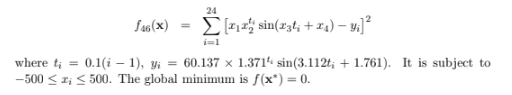
Global optimum: f(x) = 0 for x = [60.137, 1.371, 3.112, 1.761].


Εφόσον γνωρίζουμε πού βρίσκεται το ολικό ελάχιστο της συνάρτησης, θα περιορίσουμε την αναζήτησή μας στο διάστημα [0,100].

In [436]:
! pip install deap

In [437]:
import math
import numpy


def function_46(x):   #this works only for positive xi
    value=0
    for i in range(1,25):
        t=0.1 * (i-1)
        y=60.137 * math.pow(1.371,t) * math.sin(3.112 * t + 1.761)
        temp=x[0]*math.pow(x[1],t)*math.sin(x[2]*t + x[3])
        temp2=temp-y
        value = value + math.pow(temp2,2)
    return (value,)


In [438]:
#min:
function_46([60.137, 1.371, 3.112, 1.761])

(0.0,)

Ξεκινάμε ορίζοντας τις βασικές κλάσεις:

In [486]:
import numpy as np
from deap import base, creator
from deap import tools

numVariables = 4

creator.create( "FitnessMin", base.Fitness , weights=(-1.0,))
creator.create( "IndividualContainer", list , fitness= creator.FitnessMin)
toolbox0 = base.Toolbox()
toolbox0.register( "InitialValue", np.random.uniform, 1, 100)

toolbox0.register( "indiv", tools.initRepeat, creator.IndividualContainer, toolbox0.InitialValue, numVariables) #pattern for an individual with 4 attributes
toolbox0.register( "population", tools.initRepeat, list , toolbox0.indiv)

Στη συνέχεια, ορίζουμε την "ποινή" που θα επιβάλεται στις τιμές που είναι εκτός των ορίων που έχουμε θέσει. Αρχικά ορίζουμε δύο συναρτήσεις, τη "feasible" που μας επιστρέφει True αν όλα τα  xi είναι εντός του διαστήματος και False αλλιώς και την "distance" που μας ποσοτικοποιεί πόσο εκτός ορίων είναι ένα άτομο. Συγκεκριμένα επιλέγουμε η απόσταση να είναι το απόλυτο άθροισμα σε όλες τις διαστάσεις της απόστασης από το όριο. 
H συνάρτησή μας ορίζεται στο διάστημα [-500,500]. Γνωρίζοντας όμως που βρίσκεται το ολικό ελάχιστο, θα περιορίσουμε το διάστημα αναζήτησης στο [1,100]. 

In [537]:
MIN_BOUND = np.array([1,1,1,1])
MAX_BOUND = np.array([100]*numVariables)

def feasible1( indiv ):
    if any( indiv < MIN_BOUND) or any( indiv > MAX_BOUND):
        return False
    return True

def distance1( indiv ) :
    dist = 0.0
    for i in range (len( indiv )) :
        penalty = 0
        if ( indiv [i] < MIN_BOUND[i]) : penalty = MIN_BOUND[i] - indiv [i]
        if ( indiv [i] > MAX_BOUND[i]) : penalty = indiv [i] - 100
        dist = dist + penalty
    return dist

In [539]:
toolbox0.register( "evaluate", function_46)
toolbox0.decorate( "evaluate", tools.DeltaPenality (feasible1, 0.0, distance1))

In [540]:
def ea2_with_stats(pop_size,algorithm, my_mate, my_mutate, my_tournsize, gens, mate_prob, mutate_prob):
    import numpy
    
    toolbox0.register( "mate", my_mate)

    toolbox0.register( "mutate", my_mutate)
    toolbox0.register( "select", tools.selTournament, tournsize=my_tournsize)

    pop = toolbox0.population(n=pop_size)
    hof = tools.HallOfFame(1)
    stats = tools.Statistics(lambda ind: ind.fitness.values)
    stats.register("avg", numpy.mean)
    stats.register("min", numpy.min)
    stats.register("max", numpy.max)
    
    pop, logbook = algorithm(pop, toolbox0, cxpb=mate_prob, mutpb=mutate_prob, ngen=gens, stats=stats, halloffame=hof, verbose=True)
    #Τέλος με την έξοδο pop, logbook μας επιστρέφει τον τελικό πληθυσμό και το αντικείμενο logbook που περιέχει τις στατιστικές που έχουμε ορίσει για όλες τις γενιές.
    
    return pop, logbook, hof

Οι γενετικοί αλγόριθμοι που θα χρησιμοποιήσουμε είναι: απλός ΓΑ, στρατηγική εξέλιξης μ+λ, στρατηγική εξέλιξης μ * λ. Παρακάτω δηλώνουμε τις διαφορετικές περιπτώσεις τελεστών διασταύρωσης, μετάλλαξης και επιλογής, καθώς και τις στρατηγικές εξέλιξης που θα χρησιμοποιήσουμε:

In [541]:
from functools import partial
from deap import algorithms

mut_cases={}
mate_cases={}
setTourn_cases={}
alogorithms={}

mate_cases['cxBlendLow'] = partial(tools.cxBlend,alpha=0.2)
mate_cases['cxBlendHigh'] = partial(tools.cxBlend,alpha=0.7)
mate_cases['cxSimulatedBinaryLow'] = partial(tools.cxSimulatedBinary, eta=0.2)
mate_cases['cxSimulatedBinaryHigh'] = partial(tools.cxSimulatedBinary, eta=0.7)
 
# επιλέγουμε κέντρο της γκαουσιανής τη μέση του διαστήματος
mut_cases['mutGaussianLow'] = partial(tools.mutGaussian, mu = 0, sigma = 1.0, indpb = 0.5)
mut_cases['mutGaussianHigh'] = partial(tools.mutGaussian, mu = 0, sigma = 2.0, indpb = 0.5)
mut_cases['mutFlipBitLow'] = partial(tools.mutFlipBit,indpb=0.1)
mut_cases['mutFlipBitHigh'] = partial(tools.mutFlipBit, indpb=0.8) 


setTourn_cases['tournLow'] = 2
setTourn_cases['tournHigh'] = 6

#contstant values for probabilities
mutate_prob = 0.2
mate_prob = 0.5

myalgorithms={}
myalgorithms['eaSimple']=algorithms.eaSimple
#use partial so that it can be used as eaSimple. Values for mu and lamda ?
myalgorithms['eaMuPlusLambda'] = partial(algorithms.eaMuPlusLambda, mu=50, lambda_ = 150)
myalgorithms['eaMuCommaLambda'] = partial(algorithms.eaMuCommaLambda, mu=50, lambda_ = 150)

rounds=8
gens=100
population= 200

Σε πρώτη φάση θα πρέπει να βρούμε τους καταλληλότερους συνδυασμούς στρατηγικής-τελεστών. Για το σκοπό αυτό, για κάθε περίπτωση θα τυπώσουμε στατιστικά στοιχεία όπως το μέσο αριθμό επιτυχιών, το μέσο χρόνο εκτέλεσης των γύρων κλπ. Ορίζουμε βοηθητικές συναρτήσεις για υπολογισμό και καλύτερη παρουσίαση των αποτελεσμάτων. Να τονίσουμε σε αυτό το σημείο ότι θεωρούμε έναν παράγοντα DELTA και ορίζουμε ως επιτυχία την ποσότητα GOAL + DELTA, όπου GOAL το ελάχιστο της συνάρτησης(εδώ 0).

In [505]:
import numpy as np

def get_stats_singleround(log):
    succ=0
    rmin=float("inf") # η ελάχιστη τιμή αυτού του γύρου
    evals=0 # o αριθμός των αποτιμήσεων για όλες τις γενιές
    succ_gens=0 #οι γενιές που χρειάστηκε ο αλγόριθμος για να πέσει κάτω από goal + delta
    succ_min=0 #το ελάχιστο της πρώτης επιτυχημένης γενιάς
    succ_evals=0 #ο αριθμός των αποτιμήσεων για την πρώτη επιτυχημένη γενιά
    
    for gen in log:
        evals = evals + gen['nevals'];
        if (gen['min'] < rmin):
            rmin=gen['min']
        if (gen['min'] < DELTA and succ==0):
            succ=1
            succ_gens=gen['gen']
            succ_min=gen['min']
            succ_evals = evals
            
    if (succ==0):
        return succ,rmin,evals,np.nan,np.nan,np.nan
    else:
        return succ,rmin,evals,succ_gens,succ_min,succ_evals

def get_results_all_rounds(results,succ_results):
    np_results=numpy.array(results)
    successes=0
    succlist=np_results[:,0].tolist()
    for i in range(len(succlist)):
        successes=successes + succlist[i]
    avg_min = numpy.mean(np_results[:,1])
    avg_evals = numpy.mean(np_results[:,2])
    avg_time = numpy.mean(np_results[:,3])
    
    np_succ_results=numpy.array(succ_results)   
    avg_succ_gens= numpy.nanmean(np_succ_results[:,0])
    avg_succ_min= numpy.nanmean(np_succ_results[:,1])
    avg_succ_evals= numpy.nanmean(np_succ_results[:,2])
    
    return successes,avg_min, avg_evals, avg_succ_gens, avg_succ_min, avg_succ_evals, avg_time

Τώρα θα πρέπει να τρέξουμε τις διάφορες στρατηγικές για έναν αριθμό γύρων και να πάρουμε αποτελέσματα:

In [510]:
import time

def run_all_cases():
    total_results=[]
    for alg in ['eaMuPlusLambda', 'eaMuCommaLambda', 'eaSimple']:
        for mate_func in ['cxBlendLow', 'cxBlendHigh', 'cxSimulatedBinaryLow', 'cxSimulatedBinaryHigh']:
            for mut_func in ['mutGaussianLow','mutGaussianHigh','mutFlipBitLow', 'mutFlipBitHigh']:
                for tourn_sel in ['tournLow','tournHigh']:
                    results=[]
                    succ_results=[]
                    for r in range(rounds):
                        start_time = time.time()
                        pop, log, hof= ea2_with_stats(population, myalgorithms[alg],mate_cases[mate_func],mut_cases[mut_func],setTourn_cases[tourn_sel], gens, mate_prob, mutate_prob)
                        mytime = time.time() - start_time
                        succ,rmin,evals,succ_gens,succ_min,succ_evals= get_stats_singleround(log)
                        results.append([succ,rmin,evals,mytime])
                        succ_results.append([succ_gens,succ_min,succ_evals])
                    successes,avg_min, avg_evals, avg_succ_gens, avg_succ_min, avg_succ_evals,avg_time= get_results_all_rounds(results,succ_results)
                    operator = '' + mate_func + ',' + mut_func + ',' + tourn_sel
                    strategy = '' + alg + str(mutate_prob) + str(mate_prob)
                    l=[operator,strategy,successes,avg_min, avg_evals, avg_succ_gens, avg_succ_min, avg_succ_evals, avg_time]
                    total_results.append([operator,strategy,successes,avg_min, avg_evals, avg_succ_gens, avg_succ_min, avg_succ_evals, avg_time])
                    print l
    return total_results
                    

In [511]:
DELTA=0.01
save_res=run_all_cases()

gen	nevals	avg       	min    	max        
0  	200   	5.7107e+11	0.18508	1.51597e+13
1  	101   	5.61037e+10	2.35061	2.10205e+12
2  	108   	18.277     	1.72824	49.4824    
3  	109   	12.7875    	1.81077	38.5986    
4  	91    	8.18049    	1.95367	37.1723    
5  	92    	5.51215    	1.95367	16.6201    
6  	101   	3.84746    	1.95367	7.70697    
7  	109   	2.88007    	1.02076	5.62891    
8  	106   	2.32132    	1.02076	4.19997    
9  	110   	2.11617    	1.02076	3.56441    
10 	99    	1.75941    	0.600632	2.78368    
11 	98    	1.59784    	0.771999	2.05967    
12 	114   	1.33889    	0.149063	2.0623     
13 	109   	1.11617    	0.149063	1.95023    
14 	109   	0.84328    	0.407885	1.39309    
15 	105   	0.758756   	0.088318	3.12309    
16 	107   	0.561603   	0.088318	0.863849   
17 	102   	0.502704   	0.088318	0.851464   
18 	100   	0.431452   	0.28699 	0.625453   
19 	99    	0.392449   	0.258109	0.509624   
20 	106   	0.368268   	0.258109	0.459507   
21 	103   	0.327969   	0.149952	0.434462   
2

/usr/local/src/bluemix_jupyter_bundle.v82/notebook/lib/python2.7/site-packages/ipykernel/__main__.py:37: RuntimeWarning: Mean of empty slice
/usr/local/src/bluemix_jupyter_bundle.v82/notebook/lib/python2.7/site-packages/ipykernel/__main__.py:38: RuntimeWarning: Mean of empty slice
/usr/local/src/bluemix_jupyter_bundle.v82/notebook/lib/python2.7/site-packages/ipykernel/__main__.py:39: RuntimeWarning: Mean of empty slice


1  	107   	15.0918    	0.0269231	54.0249    
2  	103   	4.12437    	0.0269231	10.4603    
3  	107   	0.644837   	0.0269231	5.49348    
4  	105   	0.119085   	0.0269231	0.476718   
5  	100   	0.0273904  	0.0207538	0.0564558  
6  	111   	0.0258858  	0.0207538	0.0269231  
7  	101   	0.0232072  	0.0202062	0.0269231  
8  	99    	0.0206678  	0.0202062	0.0250366  
9  	106   	0.0202664  	0.0201156	0.0207367  
10 	108   	0.0201613  	0.0200991	0.0202062  
11 	104   	0.0201141  	0.0200991	0.0201876  
12 	107   	0.0201025  	0.0200981	0.0201156  
13 	104   	0.0200992  	0.0200975	0.0201021  
14 	113   	0.0200986  	0.0200974	0.0200991  
15 	108   	0.0200979  	0.0200974	0.0200989  
16 	108   	0.0200974  	0.0200973	0.0200978  
17 	102   	0.0200974  	0.0200973	0.0200974  
18 	102   	0.0200974  	0.0200973	0.0200974  
19 	113   	0.0200973  	0.0200973	0.0200974  
20 	116   	0.0200973  	0.0200973	0.0200973  
21 	118   	0.0200973  	0.0200973	0.0200973  
22 	104   	0.0200973  	0.0200973	0.0200973  
23 	104   

KeyboardInterrupt: 

In [512]:
def printFunc(x):
    from IPython.display import HTML, display
    import tabulate
    display(HTML(tabulate.tabulate(x, tablefmt='html')))

In [513]:
header=['<b>operators</b>', '<b>strategy</b>', '<b>successes</b>', '<b>avg.min</b>', '<b>avg.evals</b>', '<b>s.avg.gen</b>', '<b>s.avg.min</b>', '<b>s.avg.evals</b>', '<b>avg.time</b>']
x=[]
x.append(header)
for l in save_res:
    x.append(l)
printFunc(x)

operators,strategy,successes,avg.min,avg.evals,s.avg.gen,s.avg.min,s.avg.evals,avg.time
"cxBlendLow,mutGaussianLow,tournLow",eaMuPlusLambda0.20.5,8.0,0.00189581911506,10704.0,34.25,0.00598404046624,3780.5,1.45583227277
"cxBlendLow,mutGaussianLow,tournHigh",eaMuPlusLambda0.20.5,8.0,0.000549372353322,10705.875,11.375,0.00462407615687,1389.875,1.47889074683
"cxBlendLow,mutGaussianHigh,tournLow",eaMuPlusLambda0.20.5,8.0,0.00378598896384,10696.875,40.5,0.00553230735718,4454.375,1.39827725291
"cxBlendLow,mutGaussianHigh,tournHigh",eaMuPlusLambda0.20.5,8.0,0.00215422375761,10714.0,19.25,0.0047314948432,2227.375,1.4376860857
"cxBlendLow,mutFlipBitLow,tournLow",eaMuPlusLambda0.20.5,1.0,0.328188501991,10726.125,25.0,0.00698586751145,2860.0,1.31452536583
"cxBlendLow,mutFlipBitLow,tournHigh",eaMuPlusLambda0.20.5,4.0,0.060643447085,10701.0,5.0,0.00679219062312,718.25,1.34589073062
"cxBlendLow,mutFlipBitHigh,tournLow",eaMuPlusLambda0.20.5,1.0,0.0558386400756,10702.375,16.0,0.000612175538834,1856.0,1.3341639936
"cxBlendLow,mutFlipBitHigh,tournHigh",eaMuPlusLambda0.20.5,2.0,0.18437445962,10647.25,5.5,0.00456469208842,765.0,1.36673349142
"cxBlendHigh,mutGaussianLow,tournLow",eaMuPlusLambda0.20.5,8.0,1.41568534673e-10,10670.5,13.375,0.00497533831226,1602.5,1.4696791172
"cxBlendHigh,mutGaussianLow,tournHigh",eaMuPlusLambda0.20.5,8.0,1.92663654058e-08,10693.75,7.375,0.00490379394622,973.375,1.45245596766


In [515]:
#find best
best_results1=[]
for l in save_res:
    if (l[2] == 8.0):
        best_results1.append(l)

best_results1.sort(key=lambda x: x[3])


x=[]
x.append(header)
for l in best_results1:
    x.append(l)
printFunc(x)

operators,strategy,successes,avg.min,avg.evals,s.avg.gen,s.avg.min,s.avg.evals,avg.time
"cxSimulatedBinaryLow,mutFlipBitLow,tournHigh",eaMuCommaLambda0.20.5,8.0,5.35682609382e-15,10679.5,14.75,0.00429242339564,1747.5,1.42031833529
"cxSimulatedBinaryLow,mutFlipBitHigh,tournHigh",eaMuPlusLambda0.20.5,8.0,6.24500451352e-15,10703.75,13.75,0.00565212391019,1647.5,1.42781075835
"cxSimulatedBinaryLow,mutFlipBitHigh,tournHigh",eaMuCommaLambda0.20.5,8.0,6.25888230132e-15,10669.625,27.5,0.00472166615083,3078.625,1.41296124458
"cxSimulatedBinaryLow,mutGaussianLow,tournHigh",eaMuPlusLambda0.20.5,8.0,7.1054273576e-15,10721.75,7.375,0.00364089056312,981.125,1.52278524637
"cxSimulatedBinaryLow,mutFlipBitLow,tournHigh",eaMuPlusLambda0.20.5,8.0,7.1054273576e-15,10719.625,8.0,0.00419563494327,1042.75,1.4372292757
"cxSimulatedBinaryLow,mutGaussianLow,tournHigh",eaMuCommaLambda0.20.5,8.0,7.1054273576e-15,10696.5,6.625,0.00368842824061,904.375,1.51000252366
"cxBlendHigh,mutGaussianLow,tournHigh",eaSimple0.20.5,8.0,7.1054273576e-15,12244.75,4.625,0.00637319429312,767.5,1.69824561477
"cxSimulatedBinaryLow,mutGaussianLow,tournHigh",eaSimple0.20.5,8.0,7.1054273576e-15,12193.625,5.75,0.00276740483521,881.75,1.75230282545
"cxSimulatedBinaryLow,mutGaussianHigh,tournHigh",eaSimple0.20.5,8.0,7.1054273576e-15,12200.5,5.25,0.00256657037517,837.125,1.76402306557
"cxSimulatedBinaryLow,mutFlipBitLow,tournHigh",eaSimple0.20.5,8.0,7.1054273576e-15,12170.0,6.0,0.00474772715096,922.25,1.64395159483


In [516]:
#επιλέγουμε μικρότερο Δελτα για να περιορίσουμε τις καλύτερες στρατηγικές
DELTA=0.00001
save_res=run_all_cases()

gen	nevals	avg        	min     	max       
0  	200   	7.72618e+11	0.733845	1.5177e+13
1  	103   	5.19199e+09	1.29011 	2.03476e+11
2  	102   	16.3865    	0.14121 	58.0675    
3  	103   	11.9029    	0.14121 	27.2339    
4  	103   	7.23506    	0.14121 	18.7736    
5  	104   	4.56925    	0.0253533	14.57      
6  	105   	2.88879    	0.732649 	12.7475    
7  	99    	1.59668    	0.0702842	7.27851    
8  	101   	1.07094    	0.052609 	3.59506    
9  	103   	0.848486   	0.052609 	1.58798    
10 	104   	0.742983   	0.026137 	1.3205     
11 	96    	0.668441   	0.026137 	1.25419    
12 	106   	0.553585   	0.026137 	0.973335   
13 	107   	0.380719   	0.0255782	0.778641   
14 	104   	0.218025   	0.0237529	0.718958   
15 	110   	0.128978   	0.00874024	0.646018   
16 	103   	0.112821   	0.0224022 	1.08431    
17 	99    	0.0978499  	0.0230699 	0.843815   
18 	103   	0.068881   	0.0237529 	0.149271   
19 	110   	0.0576011  	0.0214736 	0.125975   
20 	109   	0.0479809  	0.0185664 	0.0817088  
21 	102   	0

/usr/local/src/bluemix_jupyter_bundle.v82/notebook/lib/python2.7/site-packages/ipykernel/__main__.py:37: RuntimeWarning: Mean of empty slice
/usr/local/src/bluemix_jupyter_bundle.v82/notebook/lib/python2.7/site-packages/ipykernel/__main__.py:38: RuntimeWarning: Mean of empty slice
/usr/local/src/bluemix_jupyter_bundle.v82/notebook/lib/python2.7/site-packages/ipykernel/__main__.py:39: RuntimeWarning: Mean of empty slice


12 	99    	0.000111176	4.97458e-06	0.000158265
13 	95    	3.25359e-05	1.044e-06  	0.000158265
14 	108   	4.56541e-06	1.044e-06  	4.97458e-06
15 	107   	2.84221e-06	6.10855e-07	4.97458e-06
16 	109   	1.02969e-06	6.10855e-07	3.62773e-06
17 	114   	6.61828e-07	6.10855e-07	8.18681e-07
18 	111   	6.29358e-07	5.99015e-07	6.7645e-07 
19 	111   	6.0624e-07 	5.85359e-07	6.20332e-07
20 	114   	5.99825e-07	5.85359e-07	6.10855e-07
21 	95    	5.96175e-07	5.85359e-07	5.99015e-07
22 	112   	5.91413e-07	5.85359e-07	5.9803e-07 
23 	103   	5.8647e-07 	5.83577e-07	5.9071e-07 
24 	109   	5.85238e-07	5.83577e-07	5.85539e-07
25 	108   	5.84818e-07	5.83577e-07	5.85381e-07
26 	104   	5.84105e-07	5.83577e-07	5.8481e-07 
27 	103   	5.83699e-07	5.83577e-07	5.84186e-07
28 	96    	5.83598e-07	5.83554e-07	5.83742e-07
29 	102   	5.83574e-07	5.83554e-07	5.83584e-07
30 	110   	5.83567e-07	5.83554e-07	5.83577e-07
31 	102   	5.83556e-07	5.83551e-07	5.83572e-07
32 	102   	5.83554e-07	5.83552e-07	5.83554e-07
33 	96    	5.

In [536]:
best_results1=[]
for l in save_res:
    if (l[2] == 8.0):
        best_results1.append(l)

best_results1.sort(key=lambda x: x[3])


x=[]
x.append(header)
for l in best_results1:
    x.append(l)
printFunc(x)

operators,strategy,successes,avg.min,avg.evals,s.avg.gen,s.avg.min,s.avg.evals,avg.time
"cxSimulatedBinaryHigh,mutFlipBitLow,tournHigh",eaMuCommaLambda0.20.5,8.0,3.60822483003e-15,10665.125,17.25,4.42652021206e-06,2011.5,1.45978119969
"cxSimulatedBinaryLow,mutGaussianHigh,tournHigh",eaMuCommaLambda0.20.5,8.0,4.48252546192e-15,10694.875,15.875,4.43672099103e-06,1868.375,1.50537851453
"cxSimulatedBinaryLow,mutFlipBitLow,tournHigh",eaMuPlusLambda0.20.5,8.0,6.23112672571e-15,10704.25,25.75,4.80351489626e-06,2918.5,1.4664721489
"cxSimulatedBinaryHigh,mutGaussianHigh,tournHigh",eaMuCommaLambda0.20.5,8.0,6.24500451352e-15,10709.25,27.0,4.75821749607e-06,3055.125,1.52525237203
"cxSimulatedBinaryLow,mutFlipBitHigh,tournHigh",eaMuPlusLambda0.20.5,8.0,7.1054273576e-15,10724.0,18.25,4.49896368693e-06,2124.625,1.49061447382
"cxBlendHigh,mutFlipBitHigh,tournHigh",eaSimple0.20.5,8.0,7.1054273576e-15,12228.75,15.875,6.07560127985e-06,2084.5,1.61844018102
"cxSimulatedBinaryLow,mutGaussianLow,tournHigh",eaSimple0.20.5,8.0,7.1054273576e-15,12185.875,15.25,5.63317326652e-06,2036.625,1.72337800264
"cxSimulatedBinaryLow,mutGaussianHigh,tournHigh",eaSimple0.20.5,8.0,7.1054273576e-15,12184.375,14.75,5.22702240247e-06,1970.25,1.74958148599
"cxSimulatedBinaryLow,mutFlipBitLow,tournHigh",eaSimple0.20.5,8.0,7.1054273576e-15,12251.875,14.625,5.85107938367e-06,1962.375,1.63769170642
"cxSimulatedBinaryLow,mutFlipBitHigh,tournHigh",eaSimple0.20.5,8.0,7.1054273576e-15,12230.25,17.0,6.38284165699e-06,2245.625,1.69450110197


H στρατηγική που θα επιλέξουμε είναι η εξής:

Algorithm | MateStrategy | MutateStrategy |
----------| ------------ | -------------- |
eaMuPlusLamda | cxSimulatedBinary | mutFlipBit |

Στη συνέχεια, θα πρέπει να κάνουμε grid search στο διάστημα [0,1, 0.9] για να βρούμε τους βέλτιστους τελεστές διασταύρωσης και μετάλλαξης για την παραπάνω στρατηγική. Θα κάνουμε grid search με βήμα 0.1 για τους τελεστες eta και indpb των στρατηγικών cxSimulatedBinary και mutFlipBit αντίστοιχα:

In [533]:
best_mate_cases={}
best_mutate_cases={}
for i in range(1,10,1):
    s = 'cxSimulatedBinary' + str(i*0.1)
    best_mate_cases[s] = partial(tools.cxSimulatedBinary, eta=i*0.1)
    
for i in range(1,10,1):
    s = 'mutFlipBit' + str(i*0.1)
    best_mutate_cases[s] = partial(tools.mutFlipBit,indpb=i*0.1)

In [542]:
import time

def run_best():
    total_results=[]
    for mate_op in range(1,10,1):
                    mate_func = 'cxSimulatedBinary' + str(mate_op*0.1)
                    mut_func = 'mutFlipBit' + str((1-mate_op*0.1))
                    results=[]
                    succ_results=[]
                    for r in range(rounds):
                        start_time = time.time()
                        pop, log, hof= ea3_with_stats(population, myalgorithms['eaMuCommaLambda'],best_mate_cases[mate_func],best_mutate_cases[mut_func],setTourn_cases['tournHigh'], gens, mate_prob, mutate_prob)
                        mytime = time.time() - start_time
                        succ,rmin,evals,succ_gens,succ_min,succ_evals= get_stats_singleround(log)
                        results.append([succ,rmin,evals,mytime])
                        succ_results.append([succ_gens,succ_min,succ_evals])
                    successes,avg_min, avg_evals, avg_succ_gens, avg_succ_min, avg_succ_evals,avg_time= get_results_all_rounds(results,succ_results)
                    operator = '' + mate_func + ',' + mut_func + ',' + 'tournHigh'
                    strategy = '' + 'eaMuCommaLambda' + str(mutate_prob) + str(mate_prob)
                    l=[operator,strategy,successes,avg_min, avg_evals, avg_succ_gens, avg_succ_min, avg_succ_evals, avg_time]
                    total_results.append([operator,strategy,successes,avg_min, avg_evals, avg_succ_gens, avg_succ_min, avg_succ_evals, avg_time])
                    print l
    return total_results

In [543]:
DELTA=0.0000001
res=run_best()

ValueError: operands could not be broadcast together with shapes (4,) (200,) 

## 2. Μελέτη κλιμακούμενης συνάρτησης



Στο δεύτερο μέρος της άσκησης θα μελετήσουμε την εξής συνάρτηση: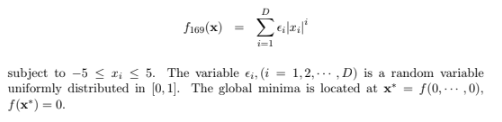

# D=2
Αρχικά θα μελετήσουμε τη συνάρτηση για δύο διαστάσεις:

In [64]:
def function_169_2d(x1,x2):
    e1=np.random.uniform(0,1)
    temp1= np.power(np.abs(x1),1)
    e2=np.random.uniform(0,1)
    temp2= np.power(np.abs(x2),2)
    value = e1*temp1+e2*temp2
    return value


In [65]:
function_169_2d(0,0)

0.0

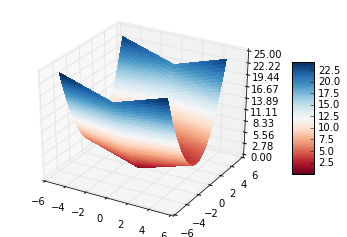

In [66]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import matplotlib.pyplot as plt
from numpy import exp,arange
from pylab import meshgrid,cm,imshow,contour,clabel,colorbar,axis,title,show

x = arange(-5.0,5.0,0.1)
y = arange(-5.0,5.0,0.1)
X,Y = meshgrid(x, y) # grid of point
Z = function_169_2d(X, Y)

fig = plt.figure()
ax = fig.gca(projection='3d')
surf = ax.plot_surface(X, Y, Z, rstride=1, cstride=1,  cmap=cm.RdBu,linewidth=0, antialiased=False)

ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

fig.colorbar(surf, shrink=0.5, aspect=5)

plt.show()


Στη συνέχεια, ζητείται να βρούμε τον βέλτιστο γενετικό αλγόριθμο για τη συνάρτηση στις 2 διαστάσεις. Θα ακολουθήσουμε τη διαδικασία του ερωτήματος 1

In [67]:
def function_169_2(x):
    value=0
    for i in range(1,3):
        e=np.random.uniform(0,1)
        temp=math.pow(abs(x[i-1]),i)
        value = value + e * temp
    return (value,)

In [68]:
function_169_2([0,0])

(0.0,)

In [69]:
numVariables = 2

creator.create( "FitnessMin", base.Fitness , weights=(-1.0,))
creator.create( "IndividualContainer", list , fitness= creator.FitnessMin)
toolbox3 = base.Toolbox()
toolbox3.register( "InitialValue", np.random.uniform, -5, 5)

toolbox3.register( "indiv", tools.initRepeat, creator.IndividualContainer, toolbox3.InitialValue, numVariables) 
toolbox3.register( "population", tools.initRepeat, list , toolbox3.indiv)

In [103]:
MIN_BOUND = np.array([-5]*numVariables)
MAX_BOUND = np.array([5]*numVariables)

def feasible2( indiv ):
    if any( indiv < MIN_BOUND) or any( indiv > MAX_BOUND):
        return False
    return True

def distance2( indiv ) :
    dist = 0.0
    for i in range (len( indiv )) :
        penalty = 0
        if ( indiv [i] < MIN_BOUND[i]) : penalty = -5 - indiv [i]
        if ( indiv [i] > MAX_BOUND[i]) : penalty = indiv [i] - 5
        dist = dist + penalty
    return dist

In [71]:
toolbox3.register( "evaluate", function_169_2)
toolbox3.decorate( "evaluate", tools.DeltaPenality (feasible2, 7.0, distance2))

In [34]:
def ea3_with_stats(pop_size,algorithm, my_mate, my_mutate, my_tournsize, gens, mate_prob, mutate_prob):
    import numpy
    
    toolbox3.register( "mate", my_mate)

    toolbox3.register( "mutate", my_mutate)
    toolbox3.register( "select", tools.selTournament, tournsize=my_tournsize)

    pop = toolbox3.population(n=pop_size)
    hof = tools.HallOfFame(1)
    stats = tools.Statistics(lambda ind: ind.fitness.values)
    stats.register("avg", numpy.mean)
    stats.register("min", numpy.min)
    stats.register("max", numpy.max)
    
    pop, logbook = algorithm(pop, toolbox3, cxpb=mate_prob, mutpb=mutate_prob, ngen=gens, stats=stats, halloffame=hof, verbose=True)
    #Τέλος με την έξοδο pop, logbook μας επιστρέφει τον τελικό πληθυσμό και το αντικείμενο logbook που περιέχει τις στατιστικές που έχουμε ορίσει για όλες τις γενιές.
    
    return pop, logbook, hof

In [40]:
import time

def run_all_cases2():
    total_results=[]
    for alg in ['eaSimple','eaMuPlusLambda','eaMuCommaLambda']:
        for mate_func in ['cxBlendLow','cxBlendHigh', 'cxSimulatedBinaryLow', 'cxSimulatedBinaryHigh']:
            for mut_func in ['mutGaussianLow','mutGaussianHigh', 'mutFlipBitLow', 'mutFlipBitHigh']:
                for tourn_sel in ['tournLow','tournHigh']:
                    results=[]
                    succ_results=[]
                    for r in range(rounds):
                        start_time = time.time()
                        pop, log, hof= ea3_with_stats(population, myalgorithms[alg],mate_cases[mate_func],mut_cases[mut_func],setTourn_cases[tourn_sel], gens, mate_prob, mutate_prob)
                        mytime = time.time() - start_time
                        succ,rmin,evals,succ_gens,succ_min,succ_evals= get_stats_singleround(log)
                        results.append([succ,rmin,evals,mytime])
                        succ_results.append([succ_gens,succ_min,succ_evals])
                    successes,avg_min, avg_evals, avg_succ_gens, avg_succ_min, avg_succ_evals,avg_time= get_results_all_rounds(results,succ_results)
                    operator = '' + mate_func + ',' + mut_func + ',' + tourn_sel
                    strategy = '' + alg + str(mutate_prob) + str(mate_prob)
                    l=[operator,strategy,successes,avg_min, avg_evals, avg_succ_gens, avg_succ_min, avg_succ_evals, avg_time]
                    total_results.append([operator,strategy,successes,avg_min, avg_evals, avg_succ_gens, avg_succ_min, avg_succ_evals, avg_time])
                    print l
    return total_results

In [41]:
DELTA=0.000000001
save_res2=run_all_cases2()

gen	nevals	avg    	min      	max    
0  	200   	5.81796	0.0978602	21.6215
1  	105   	2.61444	0.0358768	16.6414
2  	103   	1.16169	0.0358768	14.8007
3  	115   	0.565082	0.0046259	3.54612
4  	99    	0.332198	0.000739861	3.53384
5  	101   	0.19511 	0.00133117 	2.21939
6  	120   	0.119332	0.00133117 	1.82516
7  	120   	0.0800054	0.000953116	1.83902
8  	111   	0.037159 	0.000582088	1.98047
9  	117   	0.00909258	0.000316745	0.0611389
10 	109   	0.0142027 	7.72786e-05	1.06001  
11 	101   	0.00321313	2.73096e-05	0.0861514
12 	101   	0.0127568 	2.00208e-05	0.913724 
13 	103   	0.0133127 	2.00208e-05	2.18958  
14 	92    	0.00892345	9.18058e-06	1.38386  
15 	99    	0.00177231	9.18058e-06	0.196013 
16 	102   	0.00477143	5.31649e-06	0.855816 
17 	108   	0.00299771	9.99706e-07	0.531526 
18 	97    	0.000948107	1.09509e-06	0.173227 
19 	110   	0.0573125  	1.09509e-06	6.54664  
20 	84    	0.000494056	4.12058e-07	0.0567362
21 	111   	0.0264275  	1.59716e-07	2.46255  
22 	110   	0.0149948  	7.20719e-08	1

/usr/local/src/bluemix_jupyter_bundle.v82/notebook/lib/python2.7/site-packages/ipykernel/__main__.py:37: RuntimeWarning: Mean of empty slice
/usr/local/src/bluemix_jupyter_bundle.v82/notebook/lib/python2.7/site-packages/ipykernel/__main__.py:38: RuntimeWarning: Mean of empty slice
/usr/local/src/bluemix_jupyter_bundle.v82/notebook/lib/python2.7/site-packages/ipykernel/__main__.py:39: RuntimeWarning: Mean of empty slice


6  	97    	0.0614497	3.51637e-05	1.09377
7  	103   	0.0205347	0          	0.529383
8  	118   	0.00994188	0          	0.59518 
9  	112   	0.0050023 	0          	0.367259
10 	114   	0.00323336	0          	0.269757
11 	105   	0.00836657	0          	0.921762
12 	112   	0.00569131	0          	0.583538
13 	94    	0.0133864 	0          	1.13367 
14 	89    	0.0213431 	0          	1.24846 
15 	109   	0.00393181	0          	0.381918
16 	108   	0.0208423 	0          	1.60699 
17 	118   	0.0268144 	0          	0.974117
18 	101   	0.0157589 	0          	0.828995
19 	113   	0.0195722 	0          	0.796992
20 	101   	0.0331651 	0          	1.00095 
21 	99    	0.0203985 	0          	0.992149
22 	94    	0.0136139 	0          	0.816851
23 	103   	0.0136545 	0          	0.811561
24 	95    	0.0294321 	0          	1.60806 
25 	118   	0.0117952 	0          	0.945018
26 	90    	0.0197569 	0          	0.909896
27 	99    	0.00969367	0          	0.779709
28 	108   	0.0172729 	0          	0.862089
29 	111   	0.0

In [73]:
print save_res2
from sklearn.externals import joblib
joblib.dump(save_res2,'myres2a')

[['cxBlendLow,mutGaussianLow,tournLow', 'eaSimple0.20.4', 8.0, 1.2607854432291589e-16, 10614.875, 31.875, 5.5314916311067709e-10, 3529.25, 1.3089416921138763], ['cxBlendLow,mutGaussianLow,tournHigh', 'eaSimple0.20.4', 2.0, 4.4294218615669397e-05, 10587.0, 16.5, 8.5521330676323507e-10, 1947.5, 1.4157939255237579], ['cxBlendLow,mutGaussianHigh,tournLow', 'eaSimple0.20.4', 8.0, 2.9086274321186437e-12, 10586.75, 34.875, 3.9790007480461665e-10, 3849.5, 1.2621773779392242], ['cxBlendLow,mutGaussianHigh,tournHigh', 'eaSimple0.20.4', 2.0, 0.00025132837274738931, 10632.875, 47.0, 4.8213833291805265e-10, 5041.5, 1.4042294025421143], ['cxBlendLow,mutFlipBitLow,tournLow', 'eaSimple0.20.4', 8.0, 0.0, 10604.0, 2.375, 0.0, 448.875, 1.2792085707187653], ['cxBlendLow,mutFlipBitLow,tournHigh', 'eaSimple0.20.4', 8.0, 0.0, 10577.0, 2.375, 0.0, 440.375, 1.3744324147701263], ['cxBlendLow,mutFlipBitHigh,tournLow', 'eaSimple0.20.4', 8.0, 0.0, 10593.25, 1.0, 0.0, 301.5, 1.2642395198345184], ['cxBlendLow,mutFli

['myres2a']

In [74]:
def printFunc(x):
    from IPython.display import HTML, display
    import tabulate
    display(HTML(tabulate.tabulate(x, tablefmt='html')))

In [83]:
res2_list=joblib.load('myres2a') 
header=['<b>operators</b>', '<b>strategy</b>', '<b>successes</b>', '<b>avg.min</b>', '<b>avg.evals</b>', '<b>s.avg.gen</b>', '<b>s.avg.min</b>', '<b>s.avg.evals</b>', '<b>avg.time</b>']
x=[]
x.append(header)
for l in res2_list:
    x.append(l)
printFunc(x)


operators,strategy,successes,avg.min,avg.evals,s.avg.gen,s.avg.min,s.avg.evals,avg.time
"cxBlendLow,mutGaussianLow,tournLow",eaSimple0.20.4,8.0,1.26078544323e-16,10614.875,31.875,5.53149163111e-10,3529.25,1.30894169211
"cxBlendLow,mutGaussianLow,tournHigh",eaSimple0.20.4,2.0,4.42942186157e-05,10587.0,16.5,8.55213306763e-10,1947.5,1.41579392552
"cxBlendLow,mutGaussianHigh,tournLow",eaSimple0.20.4,8.0,2.90862743212e-12,10586.75,34.875,3.97900074805e-10,3849.5,1.26217737794
"cxBlendLow,mutGaussianHigh,tournHigh",eaSimple0.20.4,2.0,0.000251328372747,10632.875,47.0,4.82138332918e-10,5041.5,1.40422940254
"cxBlendLow,mutFlipBitLow,tournLow",eaSimple0.20.4,8.0,0.0,10604.0,2.375,0.0,448.875,1.27920857072
"cxBlendLow,mutFlipBitLow,tournHigh",eaSimple0.20.4,8.0,0.0,10577.0,2.375,0.0,440.375,1.37443241477
"cxBlendLow,mutFlipBitHigh,tournLow",eaSimple0.20.4,8.0,0.0,10593.25,1.0,0.0,301.5,1.26423951983
"cxBlendLow,mutFlipBitHigh,tournHigh",eaSimple0.20.4,8.0,0.0,10592.875,1.0,0.0,302.25,1.35057914257
"cxBlendHigh,mutGaussianLow,tournLow",eaSimple0.20.4,8.0,1.8653683057e-16,10572.0,36.875,3.3302653275e-10,4021.375,1.32560932636
"cxBlendHigh,mutGaussianLow,tournHigh",eaSimple0.20.4,1.0,0.000171798777887,10540.0,24.0,5.49657674115e-10,2653.0,1.39004179835


In [86]:
#find best
best_results1=[]
for l in res2_list:
    if (l[2] == 8.0):
        best_results1.append(l)

best_results2=[]
for l in best_results1:
    if (l[3] == 0.0):
        best_results2.append(l)

x=[]
x.append(header)
for l in best_results2:
    x.append(l)
printFunc(x)


operators,strategy,successes,avg.min,avg.evals,s.avg.gen,s.avg.min,s.avg.evals,avg.time
"cxBlendLow,mutFlipBitLow,tournLow",eaSimple0.20.4,8.0,0.0,10604.0,2.375,0.0,448.875,1.27920857072
"cxBlendLow,mutFlipBitLow,tournHigh",eaSimple0.20.4,8.0,0.0,10577.0,2.375,0.0,440.375,1.37443241477
"cxBlendLow,mutFlipBitHigh,tournLow",eaSimple0.20.4,8.0,0.0,10593.25,1.0,0.0,301.5,1.26423951983
"cxBlendLow,mutFlipBitHigh,tournHigh",eaSimple0.20.4,8.0,0.0,10592.875,1.0,0.0,302.25,1.35057914257
"cxBlendHigh,mutFlipBitLow,tournLow",eaSimple0.20.4,8.0,0.0,10600.625,3.5,0.0,563.25,1.27561962605
"cxBlendHigh,mutFlipBitLow,tournHigh",eaSimple0.20.4,8.0,0.0,10565.0,2.125,0.0,416.5,1.37124872208
"cxBlendHigh,mutFlipBitHigh,tournLow",eaSimple0.20.4,8.0,0.0,10583.0,1.0,0.0,310.0,1.27664497495
"cxBlendHigh,mutFlipBitHigh,tournHigh",eaSimple0.20.4,8.0,0.0,10586.25,1.0,0.0,305.375,1.392277807
"cxSimulatedBinaryLow,mutFlipBitLow,tournLow",eaSimple0.20.4,8.0,0.0,10593.625,2.25,0.0,433.125,1.31115013361
"cxSimulatedBinaryLow,mutFlipBitLow,tournHigh",eaSimple0.20.4,8.0,0.0,10614.0,2.375,0.0,453.25,1.4083135128


Παρακάτω παρουσιάζουμε τους καλύτερους συνδυασμούς

In [87]:
'''
    4 -> avg.evals
    5 -> s.avg.gens
    6 -> s.avg.min
    7 -> s.avg.evals
    8 -> avg.time
'''
#Για να βρούμε τον καλύτερο συνδυασμό θα κρατήσουμε όσα έχουν s.avg.gens=1
best_results3=[]
for l in best_results2:
    if (l[5]==1.0):
        best_results3.append(l)

x=[]
x.append(header)
for l in best_results3:
    x.append(l)
printFunc(x)

operators,strategy,successes,avg.min,avg.evals,s.avg.gen,s.avg.min,s.avg.evals,avg.time
"cxBlendLow,mutFlipBitHigh,tournLow",eaSimple0.20.4,8.0,0.0,10593.25,1.0,0.0,301.5,1.26423951983
"cxBlendLow,mutFlipBitHigh,tournHigh",eaSimple0.20.4,8.0,0.0,10592.875,1.0,0.0,302.25,1.35057914257
"cxBlendHigh,mutFlipBitHigh,tournLow",eaSimple0.20.4,8.0,0.0,10583.0,1.0,0.0,310.0,1.27664497495
"cxBlendHigh,mutFlipBitHigh,tournHigh",eaSimple0.20.4,8.0,0.0,10586.25,1.0,0.0,305.375,1.392277807
"cxSimulatedBinaryLow,mutFlipBitHigh,tournLow",eaSimple0.20.4,8.0,0.0,10613.25,1.0,0.0,303.5,1.2799898684
"cxSimulatedBinaryLow,mutFlipBitHigh,tournHigh",eaSimple0.20.4,8.0,0.0,10588.25,1.0,0.0,300.375,1.37475442886
"cxSimulatedBinaryHigh,mutFlipBitHigh,tournLow",eaSimple0.20.4,8.0,0.0,10599.75,1.0,0.0,301.75,1.2761926055
"cxSimulatedBinaryHigh,mutFlipBitHigh,tournHigh",eaSimple0.20.4,8.0,0.0,10651.125,1.0,0.0,302.375,1.36766299605
"cxBlendLow,mutFlipBitHigh,tournLow",eaMuPlusLambda0.20.4,8.0,0.0,6187.125,1.0,0.0,261.125,0.746104031801
"cxBlendLow,mutFlipBitHigh,tournHigh",eaMuPlusLambda0.20.4,8.0,0.0,6217.25,1.0,0.0,260.875,0.80437541008


In [88]:
#θα ταξινομήσουμε τα παραπάνω ως προς το s.avg.evals:
best_results3.sort(key=lambda x: x[7])
x=[]
x.append(header)
for l in best_results3:
    x.append(l)
printFunc(x)

operators,strategy,successes,avg.min,avg.evals,s.avg.gen,s.avg.min,s.avg.evals,avg.time
"cxSimulatedBinaryHigh,mutFlipBitHigh,tournHigh",eaMuPlusLambda0.20.4,8.0,0.0,6175.0,1.0,0.0,257.0,0.804550290108
"cxSimulatedBinaryLow,mutFlipBitHigh,tournLow",eaMuPlusLambda0.20.4,8.0,0.0,6194.75,1.0,0.0,258.25,0.805935412645
"cxSimulatedBinaryHigh,mutFlipBitHigh,tournLow",eaMuCommaLambda0.20.4,8.0,0.0,6196.625,1.0,0.0,258.75,0.811795324087
"cxSimulatedBinaryHigh,mutFlipBitHigh,tournLow",eaMuPlusLambda0.20.4,8.0,0.0,6193.125,1.0,0.0,258.875,0.832497745752
"cxSimulatedBinaryLow,mutFlipBitHigh,tournHigh",eaMuCommaLambda0.20.4,8.0,0.0,6197.125,1.0,0.0,259.125,0.79650002718
"cxSimulatedBinaryHigh,mutFlipBitHigh,tournHigh",eaMuCommaLambda0.20.4,8.0,0.0,6173.375,1.0,0.0,259.75,0.806832879782
"cxBlendLow,mutFlipBitHigh,tournLow",eaMuCommaLambda0.20.4,8.0,0.0,6228.75,1.0,0.0,259.875,0.728614121675
"cxBlendHigh,mutFlipBitHigh,tournLow",eaMuPlusLambda0.20.4,8.0,0.0,6167.0,1.0,0.0,260.0,0.768556028605
"cxBlendHigh,mutFlipBitHigh,tournHigh",eaMuCommaLambda0.20.4,8.0,0.0,6196.0,1.0,0.0,260.75,0.810224592686
"cxBlendLow,mutFlipBitHigh,tournHigh",eaMuPlusLambda0.20.4,8.0,0.0,6217.25,1.0,0.0,260.875,0.80437541008


Από τον ταξινομημένο πίνακα best_results3 θα επιλέξουμε ως καταλληλότερη την πρώτη στρατηγική δηλαδή:

Algorithm | MateStrategy | MutateStrategy |
----------| ------------ | -------------- |
eaMuPlusLamda | cxSimulatedBinary | mutFlipBit |


Τέλος, θα πρέπει να κάνουμε grid search στο διάστημα [0,1, 0.9] για να βρούμε τους βέλτιστους τελεστές διασταύρωσης και μετάλλαξης για την παραπάνω στρατηγική. Θα κάνουμε grid search με βήμα 0.1 για τους τελεστες eta και indpb των στρατηγικών cxSimulatedBinary και mutFlipBit αντίστοιχα:

In [50]:
best_mate_cases={}
best_mutate_cases={}
for i in range(1,10,1):
    s = 'cxSimulatedBinary' + str(i*0.1)
    best_mate_cases[s] = partial(tools.cxSimulatedBinary, eta=i*0.1)
    
for i in range(1,10,1):
    s = 'mutFlipBit' + str(i*0.1)
    best_mutate_cases[s] = partial(tools.mutFlipBit,indpb=i*0.1)

In [53]:
import time

def run_best_cases3():
    total_results=[]
    for mate_op in range(1,10,1):
                    mate_func = 'cxSimulatedBinary' + str(mate_op*0.1)
                    mut_func = 'mutFlipBit' + str((1-mate_op*0.1))
                    results=[]
                    succ_results=[]
                    for r in range(rounds):
                        start_time = time.time()
                        pop, log, hof= ea3_with_stats(population, myalgorithms['eaMuPlusLambda'],best_mate_cases[mate_func],best_mutate_cases[mut_func],setTourn_cases['tournLow'], gens, mate_prob, mutate_prob)
                        mytime = time.time() - start_time
                        succ,rmin,evals,succ_gens,succ_min,succ_evals= get_stats_singleround(log)
                        results.append([succ,rmin,evals,mytime])
                        succ_results.append([succ_gens,succ_min,succ_evals])
                    successes,avg_min, avg_evals, avg_succ_gens, avg_succ_min, avg_succ_evals,avg_time= get_results_all_rounds(results,succ_results)
                    operator = '' + mate_func + ',' + mut_func + ',' + 'tournLow'
                    strategy = '' + 'eaMuPlusLambda' + str(mutate_prob) + str(mate_prob)
                    l=[operator,strategy,successes,avg_min, avg_evals, avg_succ_gens, avg_succ_min, avg_succ_evals, avg_time]
                    total_results.append([operator,strategy,successes,avg_min, avg_evals, avg_succ_gens, avg_succ_min, avg_succ_evals, avg_time])
                    print l
    return total_results

In [91]:
DELTA=0.00000000001
best_results4= run_best_cases3()

 gen	nevals	avg    	min       	max    
0  	200   	5.39716	0.00528492	22.4838
1  	54    	2.11126	0         	7.66133
2  	57    	0.570657	0         	3.09229
3  	63    	0.126966	0         	1.51094
4  	60    	0.0026829	0         	0.134145
5  	55    	0        	0         	0       
6  	58    	0        	0         	0       
7  	55    	0        	0         	0       
8  	66    	0        	0         	0       
9  	69    	0        	0         	0       
10 	73    	0        	0         	0       
11 	61    	0        	0         	0       
12 	58    	0        	0         	0       
13 	65    	0        	0         	0       
14 	55    	0        	0         	0       
15 	54    	0        	0         	0       
16 	57    	0        	0         	0       
17 	65    	0        	0         	0       
18 	62    	0        	0         	0       
19 	60    	0        	0         	0       
20 	57    	0.0172456	0         	0.862282
21 	60    	0        	0         	0       
22 	61    	0        	0         	0       
23 	58    	0        	0      

In [92]:
best_results5=[]
for l in best_results4:
    if (l[5]==1.0):
        best_results5.append(l)

In [95]:
#θα ταξινομήσουμε τα παραπάνω ως προς το s.avg.evals:
best_results5.sort(key=lambda x: x[7])
x=[]
x.append(header)
for l in best_results5:
    x.append(l)
printFunc(x)

operators,strategy,successes,avg.min,avg.evals,s.avg.gen,s.avg.min,s.avg.evals,avg.time
"cxSimulatedBinary0.1,mutFlipBit0.9,tournLow",eaMuPlusLambda0.20.4,8.0,0.0,6185.25,1.0,0.0,258.875,2.86921411753
"cxSimulatedBinary0.2,mutFlipBit0.8,tournLow",eaMuPlusLambda0.20.4,8.0,0.0,6220.75,1.0,0.0,259.125,0.833329856396
"cxSimulatedBinary0.4,mutFlipBit0.6,tournLow",eaMuPlusLambda0.20.4,8.0,0.0,6191.625,1.0,0.0,262.125,0.781300902367


Συγκεντρωτικά, η στρατηγική στην οποία καταλήγουμε είναι:

Algorithm | MateStrategy | eta | MutateStrategy | indpb | tournsize |
----------| ------------ | --- | -------------- | ----- | --------- |
eaMuPlusLamda | cxSimulatedBinary | 0.1 | mutFlipBit | 0.9 | 3 |


## Για D=1,10,20,50 και μεγαλύτερες διαστάσεις


Στη συνέχεια, καλoύμαστε να μελετήσουμε την απόδοση της παραπάνω στρατηγικής για διαφορετικές τιμές διαστάσεων. Θα ασχοληθούμε με D=1,10,20,50,70. 

In [291]:
#Αρχικά ορίζουμε τον γενικό τύπο της συνάρτησης:
def function_169(x,n):
    res=0
    for i in range(1,n+1):
        e=np.random.uniform(0,1)
        temp= np.power(np.abs(x[i-1]),i)
        res = res + e*temp
    return (res,)

def partial(func, *args, **keywords):
    def newfunc(*fargs, **fkeywords):
        newkeywords = keywords.copy()
        newkeywords.update(fkeywords)
        return func(*(args + fargs), **newkeywords)
    newfunc.func = func
    newfunc.args = args
    newfunc.keywords = keywords
    return newfunc

function_169_1=partial(function_169,n=1)
function_169_10=partial(function_169,n=10)
function_169_20=partial(function_169,n=20)
function_169_50=partial(function_169,n=50)
function_169_70=partial(function_169,n=70)
function_169_100=partial(function_169,n=100)
function_169_200=partial(function_169,n=200)



rounds=15
gens=100
population= 200

#contstant values for probabilities
mutate_prob = 0.2
mate_prob = 0.4

best_mate_cases['cxSimulatedBinary'] = partial(tools.cxSimulatedBinary, eta=0.1)
best_mutate_cases['mutFlipBit'] = partial(tools.mutFlipBit,indpb=0.9)

import time

def run_func():
    results=[]
    succ_results=[]
    for r in range(rounds):
            start_time = time.time()
            pop, log, hof= ea3_with_stats(population, myalgorithms['eaMuPlusLambda'],best_mate_cases['cxSimulatedBinary'],best_mutate_cases['mutFlipBit'],setTourn_cases['tournLow'], gens, mate_prob, mutate_prob)
            mytime = time.time() - start_time
            succ,rmin,evals,succ_gens,succ_min,succ_evals= get_stats_singleround(log)
            results.append([succ,rmin,evals,mytime])
            succ_results.append([succ_gens,succ_min,succ_evals])
    successes,avg_min, avg_evals, avg_succ_gens, avg_succ_min, avg_succ_evals,avg_time= get_results_all_rounds(results,succ_results)
    l=[successes,avg_min, avg_evals,avg_time]
    return l

In [255]:
DELTA=0.000000001

#D=1!

numVariables = 1

creator.create( "FitnessMin", base.Fitness , weights=(-1.0,))
creator.create( "IndividualContainer", list , fitness= creator.FitnessMin)
toolbox3 = base.Toolbox()
toolbox3.register( "InitialValue", np.random.uniform, -5, 5)

toolbox3.register( "indiv", tools.initRepeat, creator.IndividualContainer, toolbox3.InitialValue, numVariables) 
toolbox3.register( "population", tools.initRepeat, list , toolbox3.indiv)

MIN_BOUND = np.array([-5]*numVariables)
MAX_BOUND = np.array([5]*numVariables)

def feasible2( indiv ):
    if any( indiv < MIN_BOUND) or any( indiv > MAX_BOUND):
        return False
    return True

def distance2( indiv ) :
    dist = 0.0
    for i in range (len( indiv )) :
        penalty = 0
        if ( indiv [i] < MIN_BOUND[i]) : penalty = -5 - indiv [i]
        if ( indiv [i] > MAX_BOUND[i]) : penalty = indiv [i] - 5
        dist = dist + penalty
    return dist

##########################################################################################################
toolbox3.register( "evaluate", function_169_1)
toolbox3.decorate( "evaluate", tools.DeltaPenality (feasible2, 7.0, distance2))
results1=run_func()


gen	nevals	avg    	min       	max    
0  	200   	1.16756	0.00178489	3.96176
1  	51    	0.329476	0         	1.82178
2  	56    	0.101051	0         	0.938257
3  	65    	0.00383 	0         	0.147179
4  	60    	0       	0         	0       
5  	63    	0.00713424	0         	0.356712
6  	64    	0         	0         	0       
7  	60    	0.00260737	0         	0.130368
8  	59    	0         	0         	0       
9  	63    	0         	0         	0       
10 	68    	0.00019905	0         	0.00995249
11 	68    	0         	0         	0         
12 	57    	0         	0         	0         
13 	62    	0         	0         	0         
14 	63    	5.52677e-05	0         	0.00276338
15 	55    	0          	0         	0         
16 	58    	0          	0         	0         
17 	51    	0          	0         	0         
18 	59    	0          	0         	0         
19 	55    	0          	0         	0         
20 	55    	0          	0         	0         
21 	59    	0.014058   	0         	0.702901  
22 	59    	0       

In [256]:
results1=[1]+results1
print results1

[1, 15.0, 0.0, 6203.6000000000004, 0.83447461128234868]


In [257]:
DELTA=0.000000001

#D=10!

numVariables = 10

creator.create( "FitnessMin", base.Fitness , weights=(-1.0,))
creator.create( "IndividualContainer", list , fitness= creator.FitnessMin)
toolbox3 = base.Toolbox()
toolbox3.register( "InitialValue", np.random.uniform, -5, 5)

toolbox3.register( "indiv", tools.initRepeat, creator.IndividualContainer, toolbox3.InitialValue, numVariables) 
toolbox3.register( "population", tools.initRepeat, list , toolbox3.indiv)

MIN_BOUND = np.array([-5]*numVariables)
MAX_BOUND = np.array([5]*numVariables)

def feasible2( indiv ):
    if any( indiv < MIN_BOUND) or any( indiv > MAX_BOUND):
        return False
    return True

def distance2( indiv ) :
    dist = 0.0
    for i in range (len( indiv )) :
        penalty = 0
        if ( indiv [i] < MIN_BOUND[i]) : penalty = -5 - indiv [i]
        if ( indiv [i] > MAX_BOUND[i]) : penalty = indiv [i] - 5
        dist = dist + penalty
    return dist

##########################################################################################################
toolbox3.register( "evaluate", function_169_10)
toolbox3.decorate( "evaluate", tools.DeltaPenality (feasible2, 7.0, distance2))
results10=run_func()

gen	nevals	avg   	min    	max        
0  	200   	570345	157.315	8.55888e+06
1  	64    	28650.6	0      	447760     
2  	59    	500.619	0      	21426.8    
3  	69    	8.10566	0      	67.5358    
4  	53    	1.07944	0      	11.2276    
5  	60    	0.0288094	0      	0.516463   
6  	63    	0        	0      	0          
7  	65    	0.069951 	0      	3.49755    
8  	56    	0        	0      	0          
9  	58    	0        	0      	0          
10 	58    	0        	0      	0          
11 	62    	0        	0      	0          
12 	66    	0        	0      	0          
13 	60    	0        	0      	0          
14 	56    	0        	0      	0          
15 	51    	0        	0      	0          
16 	61    	0        	0      	0          
17 	54    	0        	0      	0          
18 	68    	0        	0      	0          
19 	56    	0        	0      	0          
20 	54    	0        	0      	0          
21 	62    	0        	0      	0          
22 	77    	0        	0      	0          
23 	72    	0        	0      	0

In [258]:
results10=[10]+results10
print results10

[10, 15.0, 0.0, 6209.1333333333332, 1.197518523534139]


In [259]:
DELTA=0.000000001

#D=20!

numVariables = 20

creator.create( "FitnessMin", base.Fitness , weights=(-1.0,))
creator.create( "IndividualContainer", list , fitness= creator.FitnessMin)
toolbox3 = base.Toolbox()
toolbox3.register( "InitialValue", np.random.uniform, -5, 5)

toolbox3.register( "indiv", tools.initRepeat, creator.IndividualContainer, toolbox3.InitialValue, numVariables) 
toolbox3.register( "population", tools.initRepeat, list , toolbox3.indiv)

MIN_BOUND = np.array([-5]*numVariables)
MAX_BOUND = np.array([5]*numVariables)

def feasible2( indiv ):
    if any( indiv < MIN_BOUND) or any( indiv > MAX_BOUND):
        return False
    return True

def distance2( indiv ) :
    dist = 0.0
    for i in range (len( indiv )) :
        penalty = 0
        if ( indiv [i] < MIN_BOUND[i]) : penalty = -5 - indiv [i]
        if ( indiv [i] > MAX_BOUND[i]) : penalty = indiv [i] - 5
        dist = dist + penalty
    return dist

##########################################################################################################
toolbox3.register( "evaluate", function_169_20)
toolbox3.decorate( "evaluate", tools.DeltaPenality (feasible2, 7.0, distance2))
results20=run_func()

gen	nevals	avg        	min        	max        
0  	200   	4.46111e+12	2.44264e+06	7.80944e+13
1  	67    	2.12823e+10	0          	3.55572e+11
2  	62    	157854     	0          	3.43437e+06
3  	61    	23.3549    	0          	360.538    
4  	57    	2.68663    	0          	30.0684    
5  	58    	0.696683   	0          	9.03885    
6  	63    	4.77137e-05	0          	0.00217971 
7  	62    	2.4121e-26 	0          	1.20605e-24
8  	64    	3.25157e-38	0          	1.62578e-36
9  	58    	0          	0          	0          
10 	57    	0          	0          	0          
11 	60    	0.156323   	0          	7.81614    
12 	65    	0          	0          	0          
13 	66    	0          	0          	0          
14 	66    	0          	0          	0          
15 	62    	0          	0          	0          
16 	59    	0.169375   	0          	8.46875    
17 	66    	0          	0          	0          
18 	65    	0          	0          	0          
19 	59    	0          	0          	0          
20 	59    	0 

In [260]:
results20=[20]+results20
print results20

[20, 15.0, 0.0, 6200.6000000000004, 1.6650452613830566]


In [280]:
DELTA=0.00001

#D=50!

numVariables = 50

creator.create( "FitnessMin", base.Fitness , weights=(-1.0,))
creator.create( "IndividualContainer", list , fitness= creator.FitnessMin)
toolbox3 = base.Toolbox()
toolbox3.register( "InitialValue", np.random.uniform, -5, 5)

toolbox3.register( "indiv", tools.initRepeat, creator.IndividualContainer, toolbox3.InitialValue, numVariables) 
toolbox3.register( "population", tools.initRepeat, list , toolbox3.indiv)

MIN_BOUND = np.array([-5]*numVariables)
MAX_BOUND = np.array([5]*numVariables)

def feasible2( indiv ):
    if any( indiv < MIN_BOUND) or any( indiv > MAX_BOUND):
        return False
    return True

def distance2( indiv ) :
    dist = 0.0
    for i in range (len( indiv )) :
        penalty = 0
        if ( indiv [i] < MIN_BOUND[i]) : penalty = -5 - indiv [i]
        if ( indiv [i] > MAX_BOUND[i]) : penalty = indiv [i] - 5
        dist = dist + penalty
    return dist

##########################################################################################################
toolbox3.register( "evaluate", function_169_50)
toolbox3.decorate( "evaluate", tools.DeltaPenality (feasible2, 7.0, distance2))
results50=run_func()

gen	nevals	avg        	min        	max       
0  	200   	9.97533e+32	6.92756e+18	3.0896e+34
1  	55    	1.57394e+31	16.0112    	6.44785e+32
2  	63    	1.61858e+26	0          	5.43251e+27
3  	54    	68.823     	0          	327.013    
4  	61    	28.8036    	0          	365.065    
5  	66    	11.8432    	5.54987    	21.1284    
6  	55    	9.84512    	5.54987    	16.0112    
7  	53    	8.79651    	5.54987    	22.0904    
8  	62    	8.18406    	3.87769    	25.529     
9  	54    	6.6542     	3.87769    	16.6808    
10 	59    	5.86197    	4.49847    	16.7612    
11 	64    	5.50095    	1.30722    	16.7612    
12 	55    	5.1658     	1.30722    	16.7612    
13 	55    	4.62081    	1.30722    	7.07495    
14 	60    	4.26886    	1.30722    	11.5616    
15 	58    	3.91917    	0.264843   	20.5326    
16 	62    	3.53078    	0.264843   	18.2395    
17 	54    	2.96566    	0.264843   	14.3925    
18 	70    	3.22907    	0.264843   	16.0569    
19 	52    	2.20983    	0.264843   	13.4876    
20 	57    	1.09

In [281]:
results50=[50]+results50
print results50

[50, 7.0, 0.5196701072396317, 6206.333333333333, 3.0170406659444171]


In [284]:
DELTA=0.001

#D=70!

numVariables = 70

creator.create( "FitnessMin", base.Fitness , weights=(-1.0,))
creator.create( "IndividualContainer", list , fitness= creator.FitnessMin)
toolbox3 = base.Toolbox()
toolbox3.register( "InitialValue", np.random.uniform, -5, 5)

toolbox3.register( "indiv", tools.initRepeat, creator.IndividualContainer, toolbox3.InitialValue, numVariables) 
toolbox3.register( "population", tools.initRepeat, list , toolbox3.indiv)

MIN_BOUND = np.array([-5]*numVariables)
MAX_BOUND = np.array([5]*numVariables)

def feasible2( indiv ):
    if any( indiv < MIN_BOUND) or any( indiv > MAX_BOUND):
        return False
    return True

def distance2( indiv ) :
    dist = 0.0
    for i in range (len( indiv )) :
        penalty = 0
        if ( indiv [i] < MIN_BOUND[i]) : penalty = -5 - indiv [i]
        if ( indiv [i] > MAX_BOUND[i]) : penalty = indiv [i] - 5
        dist = dist + penalty
    return dist

##########################################################################################################
toolbox3.register( "evaluate", function_169_70)
toolbox3.decorate( "evaluate", tools.DeltaPenality (feasible2, 7.0, distance2))
results70=run_func()

gen	nevals	avg        	min        	max        
0  	200   	6.70921e+46	2.61542e+30	2.08218e+48
1  	60    	3.65639e+42	37.6624    	1.50135e+44
2  	57    	8.79934e+34	7.00437    	4.39702e+36
3  	55    	81.5029    	7.00437    	787.427    
4  	59    	24.2686    	7.00437    	175.444    
5  	57    	10.5876    	7.00437    	24.392     
6  	61    	8.3154     	7.00437    	26.8123    
7  	58    	7.34225    	7.00437    	12.844     
8  	53    	7.49872    	7.00437    	31.7221    
9  	63    	7.00437    	7.00437    	7.00437    
10 	63    	7.00437    	7.00437    	7.00437    
11 	53    	7.39806    	7.00437    	26.6888    
12 	62    	7.00437    	7.00437    	7.00437    
13 	53    	7.37644    	7.00437    	25.6077    
14 	64    	6.92848    	5.73953    	7.00437    
15 	63    	6.92848    	5.73953    	7.00437    
16 	58    	6.7514     	5.73953    	7.00437    
17 	64    	6.72611    	5.73953    	7.00437    
18 	61    	6.88772    	5.73953    	23.6949    
19 	56    	6.49413    	5.66469    	21.4026    
20 	53    	5.

In [285]:
results70=[70]+results70
print results70

[70, 5.0, 1.7104420845895301, 6209.2666666666664, 3.9020895957946777]


In [286]:
DELTA=0.01

numVariables =100

creator.create( "FitnessMin", base.Fitness , weights=(-1.0,))
creator.create( "IndividualContainer", list , fitness= creator.FitnessMin)
toolbox3 = base.Toolbox()
toolbox3.register( "InitialValue", np.random.uniform, -5, 5)

toolbox3.register( "indiv", tools.initRepeat, creator.IndividualContainer, toolbox3.InitialValue, numVariables) 
toolbox3.register( "population", tools.initRepeat, list , toolbox3.indiv)

MIN_BOUND = np.array([-5]*numVariables)
MAX_BOUND = np.array([5]*numVariables)

def feasible2( indiv ):
    if any( indiv < MIN_BOUND) or any( indiv > MAX_BOUND):
        return False
    return True

def distance2( indiv ) :
    dist = 0.0
    for i in range (len( indiv )) :
        penalty = 0
        if ( indiv [i] < MIN_BOUND[i]) : penalty = -5 - indiv [i]
        if ( indiv [i] > MAX_BOUND[i]) : penalty = indiv [i] - 5
        dist = dist + penalty
    return dist

##########################################################################################################
toolbox3.register( "evaluate", function_169_100)
toolbox3.decorate( "evaluate", tools.DeltaPenality (feasible2, 7.0, distance2))
results100=run_func()

gen	nevals	avg        	min        	max        
0  	200   	4.58173e+67	9.25131e+49	4.63094e+69
1  	56    	2.62219e+63	44.1578    	1.26769e+65
2  	55    	6.48179e+59	10.6128    	3.24046e+61
3  	62    	86.0473    	10.6128    	502.555    
4  	57    	30.2978    	10.6128    	364.412    
5  	62    	15.2035    	7.41913    	40.0492    
6  	57    	12.7574    	8.35066    	39.2646    
7  	57    	10.2803    	7.1176     	39.2646    
8  	57    	9.78721    	7.1176     	34.4855    
9  	51    	8.52546    	7.1176     	10.6128    
10 	57    	8.85971    	7.1176     	45.3901    
11 	64    	7.94249    	7.02726    	9.30371    
12 	61    	7.70104    	5.81221    	9.30371    
13 	62    	7.25659    	5.81221    	8.35066    
14 	66    	7.11289    	5.81221    	7.49773    
15 	62    	7.3907     	5.81221    	13.615     
16 	57    	7.04999    	5.81221    	7.1176     
17 	58    	7.07917    	5.81221    	7.1176     
18 	60    	7.07302    	5.81221    	7.1176     
19 	57    	7.09912    	6.96363    	7.1176     
20 	58    	7.

In [287]:
results100=[100]+results100
print results100

[100, 1.0, 3.8851957991438941, 6192.666666666667, 4.7560212135314943]


In [292]:
DELTA=0.1

numVariables =200

creator.create( "FitnessMin", base.Fitness , weights=(-1.0,))
creator.create( "IndividualContainer", list , fitness= creator.FitnessMin)
toolbox3 = base.Toolbox()
toolbox3.register( "InitialValue", np.random.uniform, -5, 5)

toolbox3.register( "indiv", tools.initRepeat, creator.IndividualContainer, toolbox3.InitialValue, numVariables) 
toolbox3.register( "population", tools.initRepeat, list , toolbox3.indiv)

MIN_BOUND = np.array([-5]*numVariables)
MAX_BOUND = np.array([5]*numVariables)

def feasible2( indiv ):
    if any( indiv < MIN_BOUND) or any( indiv > MAX_BOUND):
        return False
    return True

def distance2( indiv ) :
    dist = 0.0
    for i in range (len( indiv )) :
        penalty = 0
        if ( indiv [i] < MIN_BOUND[i]) : penalty = -5 - indiv [i]
        if ( indiv [i] > MAX_BOUND[i]) : penalty = indiv [i] - 5
        dist = dist + penalty
    return dist

##########################################################################################################
toolbox3.register( "evaluate", function_169_200)
toolbox3.decorate( "evaluate", tools.DeltaPenality (feasible2, 7.0, distance2))
results200=run_func()

gen	nevals	avg         	min         	max         
0  	200   	1.06596e+137	3.37969e+109	1.16664e+139
1  	60    	4.42895e+133	181.681     	2.21324e+135
2  	62    	3.47584e+119	7.21053     	8.37694e+120
3  	51    	245.45      	10.9208     	775.291     
4  	63    	106.274     	10.9208     	775.291     
5  	59    	51.1091     	7.30458     	482.066     
6  	60    	39.8411     	7.30458     	236.037     
7  	65    	22.1269     	7.30458     	149.477     
8  	56    	11.9031     	7.30458     	30.2854     
9  	57    	9.99474     	7.30458     	22.973      
10 	61    	7.91108     	7.30458     	20.5464     
11 	64    	7.45306     	7.30458     	11.0166     
12 	63    	7.30458     	7.30458     	7.30458     
13 	61    	7.30458     	7.30458     	7.30458     
14 	62    	7.58912     	7.30458     	21.5319     
15 	71    	7.30458     	7.30458     	7.30458     
16 	64    	7.30458     	7.30458     	7.30458     
17 	64    	7.30458     	7.30458     	7.30458     
18 	59    	7.30458     	7.30458     	7.30458     


/usr/local/src/bluemix_jupyter_bundle.v82/notebook/lib/python2.7/site-packages/ipykernel/__main__.py:37: RuntimeWarning: Mean of empty slice
/usr/local/src/bluemix_jupyter_bundle.v82/notebook/lib/python2.7/site-packages/ipykernel/__main__.py:38: RuntimeWarning: Mean of empty slice
/usr/local/src/bluemix_jupyter_bundle.v82/notebook/lib/python2.7/site-packages/ipykernel/__main__.py:39: RuntimeWarning: Mean of empty slice


In [293]:
results200=[200]+results200
print results200

[200, 0.0, 6.343554057821299, 6190.666666666667, 7.235314639409383]


In [294]:
from IPython.display import display, Markdown
display(Markdown('<b>Τα αποτελέσματα της παραπάνω διαδικασίας είναι τα εξής:</b>'))
        
header=['<b>D</b>', '<b>successes</b>', '<b>avg.min</b>', '<b>avg.evals</b>', '<b>avg.time</b>']
total_results=[]
total_results.append(header)
total_results.append(results1)
total_results.append(results10)
total_results.append(results20)
total_results.append(results50)
total_results.append(results70)
total_results.append(results100)
total_results.append(results200)

printFunc(total_results)

<b>Τα αποτελέσματα της παραπάνω διαδικασίας είναι τα εξής:</b>

D,successes,avg.min,avg.evals,avg.time
1,15.0,0.0,6203.6,0.834474611282
10,15.0,0.0,6209.13333333,1.19751852353
20,15.0,0.0,6200.6,1.66504526138
50,7.0,0.51967010724,6206.33333333,3.01704066594
70,5.0,1.71044208459,6209.26666667,3.90208959579
100,1.0,3.88519579914,6192.66666667,4.75602121353
200,0.0,6.34355405782,6190.66666667,7.23531463941


Παρατηρούμε ότι για μεγάλο αριθμό διαστάσεων (>50) ο αριθμός των επιτυχιών μειώνεται αισθητά και η μέση ελάχιστη τιμή αυξάνεται. Αυξάνουμε τον πληθυσμό και τον αριθμό των γενεών και τα ξανατρέχουμε:

In [317]:
gens=100
population= 400

In [318]:
DELTA=0.00001

#D=50!

numVariables = 50

creator.create( "FitnessMin", base.Fitness , weights=(-1.0,))
creator.create( "IndividualContainer", list , fitness= creator.FitnessMin)
toolbox3 = base.Toolbox()
toolbox3.register( "InitialValue", np.random.uniform, -5, 5)

toolbox3.register( "indiv", tools.initRepeat, creator.IndividualContainer, toolbox3.InitialValue, numVariables) 
toolbox3.register( "population", tools.initRepeat, list , toolbox3.indiv)

MIN_BOUND = np.array([-5]*numVariables)
MAX_BOUND = np.array([5]*numVariables)

def feasible2( indiv ):
    if any( indiv < MIN_BOUND) or any( indiv > MAX_BOUND):
        return False
    return True

def distance2( indiv ) :
    dist = 0.0
    for i in range (len( indiv )) :
        penalty = 0
        if ( indiv [i] < MIN_BOUND[i]) : penalty = -5 - indiv [i]
        if ( indiv [i] > MAX_BOUND[i]) : penalty = indiv [i] - 5
        dist = dist + penalty
    return dist

##########################################################################################################
toolbox3.register( "evaluate", function_169_50)
toolbox3.decorate( "evaluate", tools.DeltaPenality (feasible2, 7.0, distance2))
results50=run_func()

gen	nevals	avg        	min        	max        
0  	500   	8.75738e+32	1.25543e+22	3.90596e+34
1  	51    	1.91615e+30	19.8592    	6.79055e+31
2  	62    	1.8092e+26 	14.5681    	4.00493e+27
3  	58    	3.19542e+10	7.44212    	1.59771e+12
4  	63    	32.5838    	5.70938    	231.995    
5  	60    	17.1616    	4.97096    	245.084    
6  	54    	9.77227    	5.51883    	20.3558    
7  	60    	7.80153    	3.33838    	18.5228    
8  	60    	5.98843    	2.51521    	17.5903    
9  	48    	5.18564    	2.51521    	8.11227    
10 	62    	4.43628    	2.51521    	5.70938    
11 	61    	3.86167    	2.51521    	6.68592    
12 	62    	3.51299    	2.51521    	5.51883    
13 	60    	3.20854    	2.51521    	4.86548    
14 	61    	3.22572    	2.51521    	15.9075    
15 	56    	2.8324     	2.51521    	4.57436    
16 	60    	2.77841    	2.44735    	5.33191    
17 	55    	2.72331    	2.44735    	4.57436    
18 	55    	2.59041    	2.08726    	4.14983    
19 	63    	2.74318    	2.08726    	5.05159    
20 	64    	2.

In [319]:
results50=[50]+results50
print results50

[50, 9.0, 0.23870074011219541, 6506.666666666667, 3.1412667910257976]


In [320]:
DELTA=0.01

#D=70!

numVariables = 70

creator.create( "FitnessMin", base.Fitness , weights=(-1.0,))
creator.create( "IndividualContainer", list , fitness= creator.FitnessMin)
toolbox3 = base.Toolbox()
toolbox3.register( "InitialValue", np.random.uniform, -5, 5)

toolbox3.register( "indiv", tools.initRepeat, creator.IndividualContainer, toolbox3.InitialValue, numVariables) 
toolbox3.register( "population", tools.initRepeat, list , toolbox3.indiv)

MIN_BOUND = np.array([-5]*numVariables)
MAX_BOUND = np.array([5]*numVariables)

def feasible2( indiv ):
    if any( indiv < MIN_BOUND) or any( indiv > MAX_BOUND):
        return False
    return True

def distance2( indiv ) :
    dist = 0.0
    for i in range (len( indiv )) :
        penalty = 0
        if ( indiv [i] < MIN_BOUND[i]) : penalty = -5 - indiv [i]
        if ( indiv [i] > MAX_BOUND[i]) : penalty = indiv [i] - 5
        dist = dist + penalty
    return dist

##########################################################################################################
toolbox3.register( "evaluate", function_169_70)
toolbox3.decorate( "evaluate", tools.DeltaPenality (feasible2, 7.0, distance2))
results70=run_func()

gen	nevals	avg        	min        	max        
0  	500   	7.80402e+46	1.80188e+34	6.19343e+48
1  	53    	7.41211e+43	46.3497    	2.67315e+45
2  	70    	1.9287e+39 	7.19262    	4.19418e+40
3  	60    	75.7716    	1.9727e-05 	350.152    
4  	62    	40.1921    	1.9727e-05 	179.408    
5  	63    	14.7756    	1.9727e-05 	51.4704    
6  	61    	8.73008    	1.9727e-05 	27.3095    
7  	60    	6.30784    	1.9727e-05 	20.635     
8  	62    	4.18104    	1.9727e-05 	9.28231    
9  	65    	2.35479    	9.53769e-06	25.3236    
10 	59    	1.64782    	2.61748e-06	15.5129    
11 	63    	0.953958   	8.18809e-07	33.6406    
12 	66    	1.10751e-05	2.66265e-07	2.40848e-05
13 	68    	7.14144e-06	2.66265e-07	1.9727e-05 
14 	60    	5.5051e-06 	4.04048e-08	2.62027e-05
15 	56    	2.98945e-06	4.04048e-08	2.15645e-05
16 	51    	1.12897e-06	4.04048e-08	5.93128e-06
17 	59    	0.608684   	4.04048e-08	30.4342    
18 	65    	0.589936   	4.04048e-08	29.4968    
19 	62    	5.99749e-07	4.04048e-08	1.13134e-05
20 	58    	7.

In [321]:
results70=[70]+results70
print results70

[70, 4.0, 0.98839598107958127, 6501.1333333333332, 4.1228165308634441]


In [323]:
DELTA=0.01
population=400

numVariables =100

creator.create( "FitnessMin", base.Fitness , weights=(-1.0,))
creator.create( "IndividualContainer", list , fitness= creator.FitnessMin)
toolbox3 = base.Toolbox()
toolbox3.register( "InitialValue", np.random.uniform, -5, 5)

toolbox3.register( "indiv", tools.initRepeat, creator.IndividualContainer, toolbox3.InitialValue, numVariables) 
toolbox3.register( "population", tools.initRepeat, list , toolbox3.indiv)

MIN_BOUND = np.array([-5]*numVariables)
MAX_BOUND = np.array([5]*numVariables)

def feasible2( indiv ):
    if any( indiv < MIN_BOUND) or any( indiv > MAX_BOUND):
        return False
    return True

def distance2( indiv ) :
    dist = 0.0
    for i in range (len( indiv )) :
        penalty = 0
        if ( indiv [i] < MIN_BOUND[i]) : penalty = -5 - indiv [i]
        if ( indiv [i] > MAX_BOUND[i]) : penalty = indiv [i] - 5
        dist = dist + penalty
    return dist

##########################################################################################################
toolbox3.register( "evaluate", function_169_100)
toolbox3.decorate( "evaluate", tools.DeltaPenality (feasible2, 7.0, distance2))
results100=run_func()

gen	nevals	avg        	min        	max        
0  	400   	2.18728e+67	7.33696e+51	1.64367e+69
1  	55    	8.94868e+64	106.104    	2.18281e+66
2  	58    	1.9391e+57 	85.0178    	9.69536e+58
3  	56    	350.836    	7.90808    	3593.68    
4  	56    	53.1385    	7.90808    	506.988    
5  	61    	20.5104    	7.82283    	106.104    
6  	67    	13.2384    	7.28789    	57.4114    
7  	50    	11.4392    	7.28789    	31.7237    
8  	60    	9.88389    	7.27917    	69.8034    
9  	57    	7.8038     	7.27917    	10.593     
10 	61    	7.57341    	7.27917    	13.0021    
11 	66    	8.86376    	7.13836    	64.8058    
12 	61    	7.53694    	7.01977    	14.8103    
13 	55    	7.25738    	7.01977    	7.35419    
14 	54    	7.22776    	7.03097    	7.28789    
15 	53    	7.18221    	7.03097    	7.28789    
16 	59    	14.3775    	3.5402     	373.905    
17 	50    	7.063      	3.5402     	9.07171    
18 	59    	6.47956    	3.5402     	7.27917    
19 	55    	6.81483    	3.5402     	44.4145    
20 	56    	5.

In [324]:
results100=[100]+results100
print results100

[100, 2.0, 3.5319112193686122, 6381.4666666666662, 4.711185153325399]


In [325]:
DELTA=0.1

numVariables =200

creator.create( "FitnessMin", base.Fitness , weights=(-1.0,))
creator.create( "IndividualContainer", list , fitness= creator.FitnessMin)
toolbox3 = base.Toolbox()
toolbox3.register( "InitialValue", np.random.uniform, -5, 5)

toolbox3.register( "indiv", tools.initRepeat, creator.IndividualContainer, toolbox3.InitialValue, numVariables) 
toolbox3.register( "population", tools.initRepeat, list , toolbox3.indiv)

MIN_BOUND = np.array([-5]*numVariables)
MAX_BOUND = np.array([5]*numVariables)

def feasible2( indiv ):
    if any( indiv < MIN_BOUND) or any( indiv > MAX_BOUND):
        return False
    return True

def distance2( indiv ) :
    dist = 0.0
    for i in range (len( indiv )) :
        penalty = 0
        if ( indiv [i] < MIN_BOUND[i]) : penalty = -5 - indiv [i]
        if ( indiv [i] > MAX_BOUND[i]) : penalty = indiv [i] - 5
        dist = dist + penalty
    return dist

##########################################################################################################
toolbox3.register( "evaluate", function_169_200)
toolbox3.decorate( "evaluate", tools.DeltaPenality (feasible2, 7.0, distance2))
results200=run_func()

gen	nevals	avg         	min         	max         
0  	400   	2.86132e+137	2.60434e+113	3.39657e+139
1  	67    	2.45882e+133	312.892     	7.34576e+134
2  	63    	4.13616e+127	51.8319     	2.06807e+129
3  	56    	280.864     	16.8468     	1569.96     
4  	54    	89.9395     	8.33785     	667.062     
5  	60    	42.6269     	8.33785     	525.355     
6  	62    	27.7268     	8.33785     	146.655     
7  	60    	14.5708     	7.18033     	120.245     
8  	66    	9.01352     	7.18033     	16.6835     
9  	62    	8.33984     	7.18033     	8.63559     
10 	60    	10.7474     	7.18033     	70.0548     
11 	59    	72.7025     	7.18033     	3187.85     
12 	61    	7.77075     	7.18033     	8.63559     
13 	67    	7.66557     	7.18033     	8.63559     
14 	61    	10.2506     	7.18033     	62.8201     
15 	68    	9.08425     	7.18033     	32.1148     
16 	60    	8.08231     	7.18033     	30.6795     
17 	55    	7.35287     	7.18033     	7.6878      
18 	64    	8.29119     	7.18033     	25.277      


In [326]:
results200=[200]+results200
print results200

[200, 1.0, 6.3319745695302156, 6398.8666666666668, 7.5174315134684244]


In [327]:
from IPython.display import display, Markdown
display(Markdown('<b>Τα αποτελέσματα της παραπάνω διαδικασίας είναι τα εξής:</b>'))
        
header=['<b>D</b>', '<b>successes</b>', '<b>avg.min</b>', '<b>avg.evals</b>', '<b>avg.time</b>']
total_results=[]
total_results.append(header)
total_results.append(results1)
total_results.append(results10)
total_results.append(results20)
total_results.append(results50)
total_results.append(results70)
total_results.append(results100)
total_results.append(results200)

printFunc(total_results)

<b>Τα αποτελέσματα της παραπάνω διαδικασίας είναι τα εξής:</b>

D,successes,avg.min,avg.evals,avg.time
1,15.0,0.0,6203.6,0.834474611282
10,15.0,0.0,6209.13333333,1.19751852353
20,15.0,0.0,6200.6,1.66504526138
50,9.0,0.238700740112,6506.66666667,3.14126679103
70,4.0,0.98839598108,6501.13333333,4.12281653086
100,2.0,3.53191121937,6381.46666667,4.71118515333
200,1.0,6.33197456953,6398.86666667,7.51743151347


Παρατηρούμε ότι η μέση ελάχιστη τιμή έχει μειωθεί σημαντικά, αλλά έχει αυξηθεί ο μέσος αριθμός αποτιμήσεων, ενώ υπάρχει και μικρή βελτίωση στον αριθμό των επιτυχιών. Παρόλα αυτά, ίσως με κάποια άλλη στρατηγική θα μπορούσαμε να είχαμε επιτύχει καλύτερα αποτελέσματα για μεγάλο αριθμό διαστάσεων. Για να επιτευχθεί αυτό απαιτείται δοκιμή διαφόρων τεχνικών και συντελεστών το οποίο κοστίζει πολύ χρονικά. Επιπλέον, παρατηρούμε ότι όσο αυξάνονται οι διαστάσεις, τόσο πρέπει να μειώνεται το Delta ώστε να έχουμε συγκρίσιμα αποτελέσματα. Όμως αυτό υποδηλώνει και μια έκπτωση στην ορθότητα της στρατηγικής που επιλέγουμε.